# Figures

In [1]:
import numpy as np                                # scientific computing toolkit
import pandas as pd                               # data analysis toolkit
import scanpy as sc                               # scanpy is referred to with sc.***
import scvelo as scv                              # RNA velocity toolkit
import matplotlib.pyplot as plt                   # Matplotlib is referred to with plt.***
from matplotlib_venn import venn3, venn3_circles  # Venn diagrams
from scipy import stats                           # for linear regressions
import seaborn as sns                             # for easy heatmaps
import scirpy as ir                               # TCR analysis
import itertools
import gseapy

sc.settings.verbosity = 0                         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()                       # check if all needed versions are installed and up to date

scanpy==1.4.3 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.1 pandas==1.1.5 scikit-learn==0.21.3 statsmodels==0.11.1 python-igraph==0.7.1+4.bed07760 louvain==0.6.1 leidenalg==0.7.0


In [2]:
sc.settings.set_figure_params(dpi=80, dpi_save=300, color_map='viridis')
clonotypes_re_expression=['2','4','5','13','14','23','49','74','184','471']
order=['Blood_before','Infusion_product','Blood_after']
adata = sc.read('adata_figures.h5ad')
#adata.obs.clonotype[adata.obs.clonotype=='472']='471'
clonotypes_greater_2=adata.obs.clonotype[adata.obs.clonotype_size>2].unique().tolist()
adata=adata[adata.obs.leiden!='6'] #exclude cluster containing non T cells (Monocyte impurities)

In [3]:
chain_pairing_all=np.round((adata.obs.chain_pairing.value_counts(normalize=True)*100),1).astype('str')+' %'
chain_pairing_T=np.round((adata[adata.raw[:,'CD3D'].X>0, : ].obs.chain_pairing.value_counts(normalize=True)*100),1).astype('str')+' %'

In [4]:
print('%.2f' % ((adata[adata.obs.chain_pairing.isin(['Single pair', 'Extra beta', 'Extra alpha', 'Two full chains'])].shape[0]/adata.shape[0])*100)+' % of the cells have at least one alpha/beta pair')
print('%.2f' % ((adata[adata.obs.chain_pairing.isin(['Single pair', 'Extra beta', 'Extra alpha', 'Two full chains'])].shape[0]/adata[adata.raw[:,'CD3D'].X>0, : ].shape[0])*100)+' % of the T cells have at least one alpha/beta pair')

59.92 % of the cells have at least one alpha/beta pair
78.90 % of the T cells have at least one alpha/beta pair


In [5]:
adata.obs.samplename.cat.rename_categories({'Blood_before':'PB-pre','Blood_after':'PB-post','Infusion_product':'TIL'}, inplace=True)
adata.uns['samplename_colors']=['#b80000','#e86464','#a3a3a3'] #['#1f77b4', '#ff7f0e', '#279e68']
adata.uns['leiden_colors']=['#1f77b4', '#ff7f0e', '#279e68', '#aa40fc','#e377c2','#7f7f7f'] #['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b']
#adata.uns['leiden_colors']=['#404040', '#6e6e6e', '#a8a8a8', '#d1d1d1','#8a8a8a','#000000']

Trying to set attribute `.uns` of view, copying.


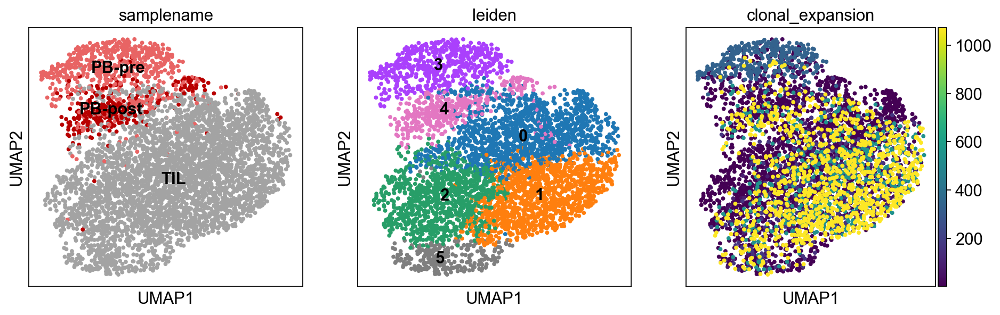

In [6]:
fig,ax = plt.subplots(ncols=3, figsize=(14,4))
sc.pl.umap(adata, color='samplename', show=False, legend_loc='on data', s=50, ax=ax[0])
sc.pl.umap(adata, color='leiden', show=False, legend_loc='on data', s=50, ax=ax[1])
sc.pl.umap(adata, color='clonal_expansion', s=50, show=False, ax=ax[2])
fig.savefig('./figures_paper/umaps.svg', dpi=300, bbox_inches='tight')

In [7]:
data=adata.obs.groupby(['samplename']).count()
data=pd.DataFrame(index=['PB-post', 'PB-pre', 'TIL'], columns=['0','1','2','3','4','5'])
for column in data.columns.tolist():
    for row in data.index.tolist():
        data.loc[row,column]=adata[(adata.obs.samplename==row) & (adata.obs.leiden==column)].shape[0]

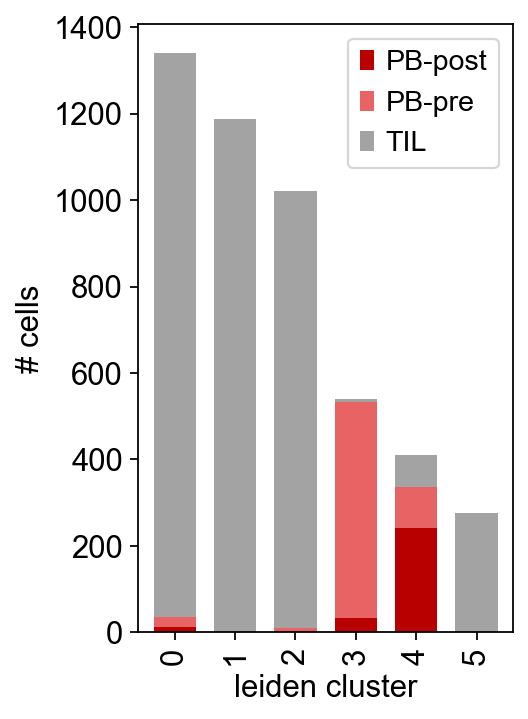

In [8]:
fig, ax=plt.subplots(figsize=(3,5))
data[['0','1','2','3','4','5']].T.plot(kind='bar', stacked=True, color=['#b80000','#e86464','#a3a3a3'], ax=ax, grid=False, width=0.7)
ax.set_xlabel('leiden cluster')
ax.set_ylabel('# cells')
plt.show()
fig.savefig('./figures_paper/n_cells_clusters.svg', dpi=300, bbox_inches='tight')

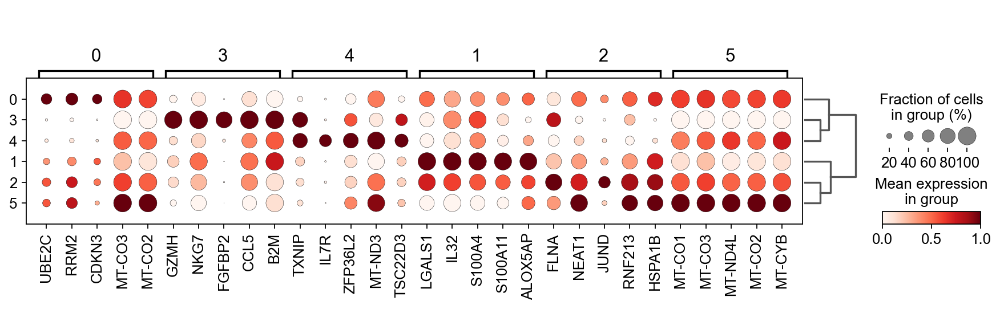

In [9]:
sc.tl.dendrogram(adata, groupby='leiden')
sc.tl.rank_genes_groups(adata, 'leiden', use_raw=True, method='t-test')
sc.pl.rank_genes_groups_dotplot(adata, n_genes=5, show=False, standard_scale='var')
plt.savefig('./figures_paper/dotplot_leiden.svg', dpi=300, bbox_inches='tight')

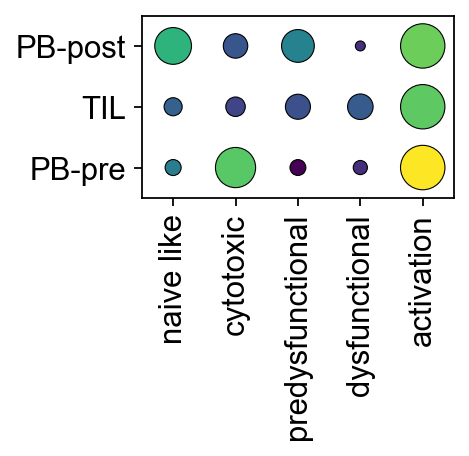

In [10]:
fig,ax=plt.subplots(figsize=(2.5,1.5))
df_dotplot=adata.obs.groupby('samplename').agg({'naive_like_state':'mean',
                                                'cytotoxic_state':'mean',
                                                'predysfunctional_state':'mean', 
                                                'dysfunctional_state':'mean',
                                                'activation_score':'mean'})
df_dotplot=df_dotplot.loc[['PB-pre','TIL','PB-post']]
df_size=df_dotplot.copy()
for column in df_size.columns:
    df_size[column]=adata.obs[adata.obs[column] > 0].groupby('samplename')['cytotoxic_activation'].count()/adata.obs.groupby('samplename')['cytotoxic_activation'].count()

sns.scatterplot(x=df_dotplot.columns.tolist()*df_dotplot.index.shape[0],
            y=list(itertools.chain(*[[df_dotplot.index.tolist()[i]]*df_dotplot.columns.shape[0] for i in range(df_dotplot.shape[0])])), size=df_size.values.flatten().tolist(),
            hue=df_dotplot.values.flatten().tolist(), edgecolor='black', linewidth=.5, ax=ax, 
            sizes=(20,400), palette='viridis', vmin=0)
ax.set_xticklabels(['naive like', 'cytotoxic', 'predysfunctional', 'dysfunctional', 'activation'], rotation=90)
ax.get_legend().remove()
ax.set_xlim([-0.5,4.5])
ax.set_ylim([-0.5,2.5])
ax.grid(None)
plt.savefig('./figures_paper/dotplot_scores_absolute.svg', dpi=300, bbox_inches='tight')
plt.show()

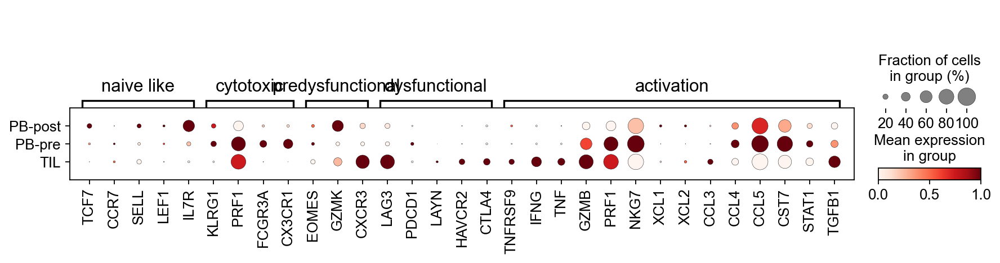

In [11]:
t=sc.pl.dotplot(adata, var_names=['TCF7','CCR7','SELL','LEF1','IL7R',
                                  'KLRG1','PRF1','FCGR3A','CX3CR1',
                                  'EOMES', 'GZMK', 'CXCR3',
                                  'LAG3', 'PDCD1', 'LAYN', 'HAVCR2','CTLA4',
                                  'TNFRSF9','IFNG','TNF','GZMB','PRF1','NKG7','XCL1','XCL2','CCL3','CCL4','CCL5','CST7','STAT1','TGFB1'], 
              var_group_positions=[(0,4),(5,8),(9,11),(12,16),(17,30)],
              var_group_labels=['naive like' ,'cytotoxic', 'predysfunctional', 'dysfunctional','activation'], groupby='samplename',
             standard_scale='var', var_group_rotation=0, show=False)
plt.savefig('./figures_paper/dotplot_score_genes.svg', dpi=300, bbox_inches='tight')

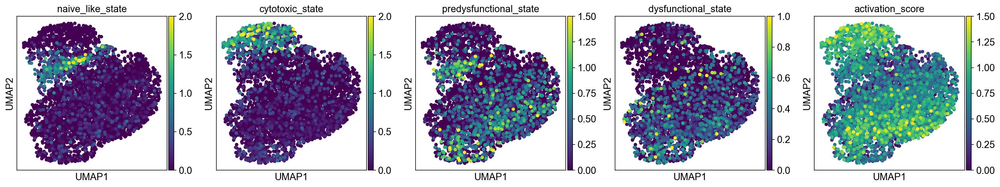

In [12]:
sc.pl.umap(adata, color=['naive_like_state','cytotoxic_state','predysfunctional_state', 'dysfunctional_state','activation_score'], ncols=5, s=100, vmax=[2,2,1.5,1,1.5],vmin=0, show=False, color_map='viridis')
plt.savefig('./figures_paper/feature_plot_scores.svg', dpi=300, bbox_inches='tight')

In [13]:
test=adata.raw
adata.obs['CX3CR1_']=[x[0] for x in test[:,test.var_names=='CX3CR1'].X.todense().tolist()]
adata.obs['GZMK_']=[x[0] for x in test[:,test.var_names=='GZMK'].X.todense().tolist()]
adata.obs['PRF1_']=[x[0] for x in test[:,test.var_names=='PRF1'].X.todense().tolist()]

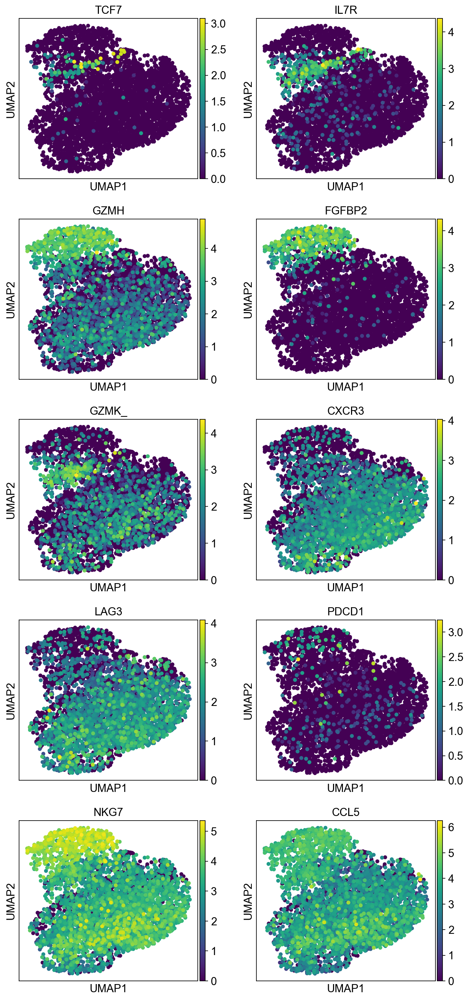

In [14]:
sc.pl.umap(adata, color=['TCF7','IL7R','GZMH','FGFBP2','GZMK_','CXCR3','LAG3','PDCD1','NKG7','CCL5'], ncols=2, s=100, show=False,color_map='viridis')
plt.savefig('./figures_paper/feature_plot_score_genes.svg', dpi=300, bbox_inches='tight')

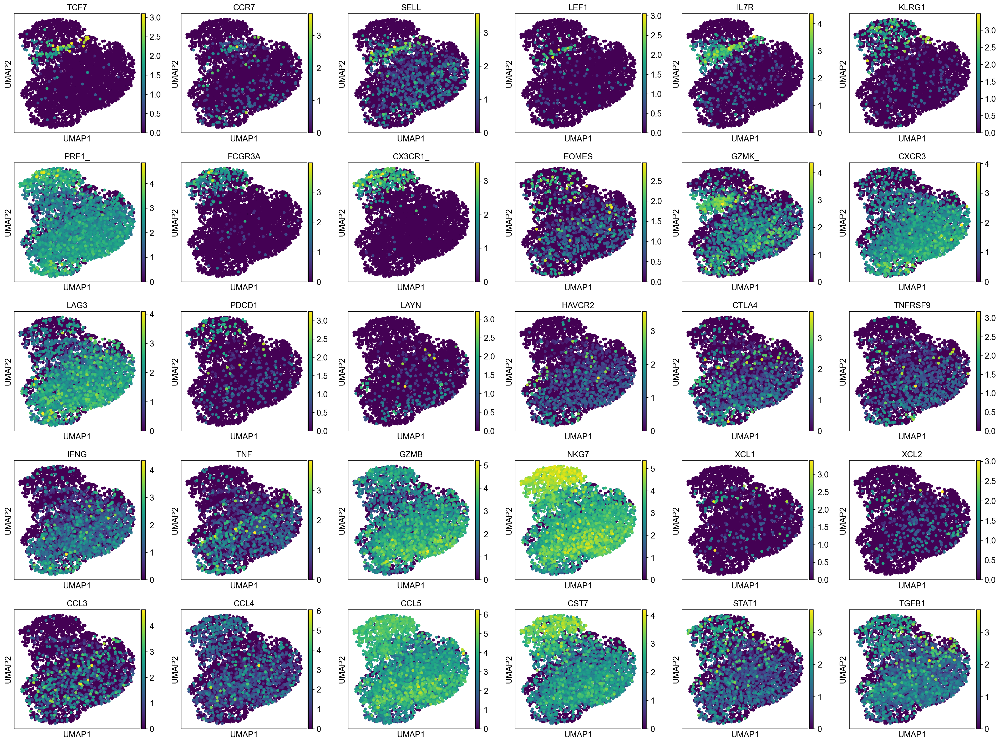

In [15]:
sc.pl.umap(adata, color=['TCF7','CCR7','SELL','LEF1','IL7R',
                                  'KLRG1','PRF1_','FCGR3A','CX3CR1_',
                                  'EOMES', 'GZMK_', 'CXCR3',
                                  'LAG3', 'PDCD1', 'LAYN', 'HAVCR2','CTLA4',
                                  'TNFRSF9','IFNG','TNF','GZMB','NKG7','XCL1','XCL2','CCL3','CCL4','CCL5','CST7','STAT1','TGFB1'], ncols=6, s=100, show=False)
plt.savefig('./figures_paper/feature_plot_score_genes.svg', dpi=300, bbox_inches='tight')

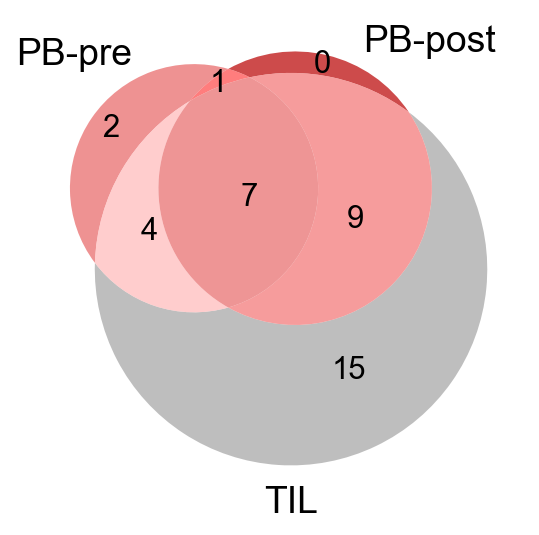

In [16]:
list_pb_pre=adata.obs[(adata.obs.samplename=='PB-pre')&(adata.obs.clonotype_size>2)].clonotype.unique().tolist()
list_pb_post=adata.obs[(adata.obs.samplename=='PB-post')&(adata.obs.clonotype_size>2)].clonotype.unique().tolist()
list_TIL=adata.obs[(adata.obs.samplename=='TIL')&(adata.obs.clonotype_size>2)].clonotype.unique().tolist()
venn3([set(list_pb_pre),set(list_pb_post),set(list_TIL)], set_labels=('PB-pre', 'PB-post', 'TIL'), set_colors=['#e86464','#b80000','#a3a3a3'], alpha=0.7)
plt.savefig('./figures_paper/clonotype_venn.svg', dpi=300, bbox_inches='tight')

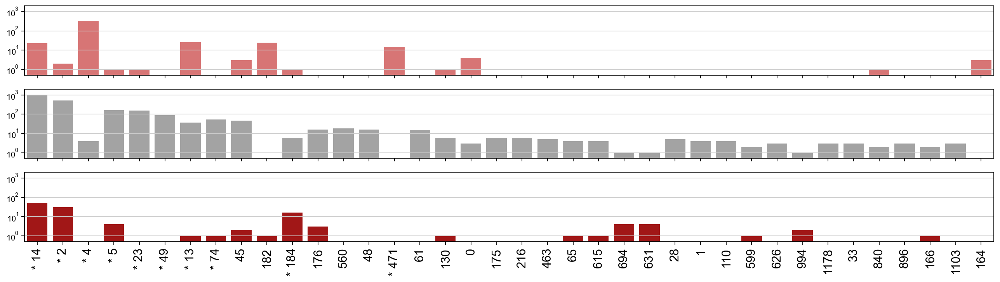

In [17]:
fig, ax=plt.subplots(nrows=3, figsize=(20,5), sharex=True)
data=adata.obs[adata.obs.clonotype_size>2].sort_values('clonotype_size', ascending=False).groupby(['clonotype','samplename'], sort=False).agg({'clonotype_size':'count', 'clonotype':'first', 'samplename':'first'})
sns.barplot(data=data, x='clonotype', y='clonotype_size', ax=ax[0], hue='samplename', hue_order=['PB-pre'], palette=['#e86464'])
sns.barplot(data=data, x='clonotype', y='clonotype_size', ax=ax[1], hue='samplename', hue_order=['TIL'], palette=['#a3a3a3'])
sns.barplot(data=data, x='clonotype', y='clonotype_size', ax=ax[2], hue='samplename', hue_order=['PB-post'], palette=['#b80000'])
for ax in ax:
    ax.set_yscale('log')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.get_legend().remove()
    ax.set_ylim([0.5,2000])
    ax.set_yticks([1,10,100,1000])
    ax.tick_params(axis='y', which='major', labelsize=9)
ax.set_xticklabels(['* '+x if x in clonotypes_re_expression else x for x in data.index.get_level_values(0).categories.tolist()], rotation=90)
fig.savefig('./figures_paper/clonotype_size_samplename.svg', dpi=300, bbox_inches='tight')
plt.show()

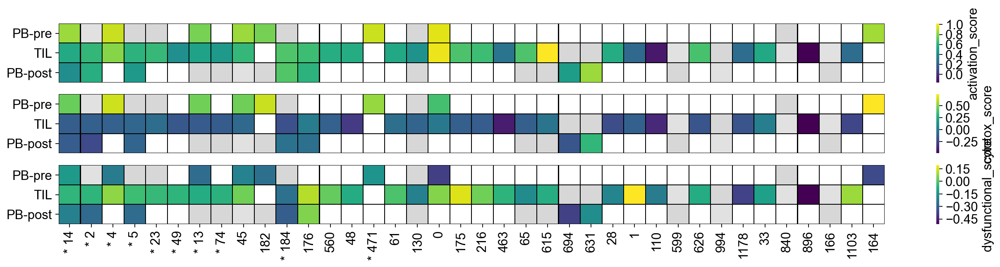

In [68]:
mask=adata.obs[adata.obs.clonotype_size>2].sort_values('clonotype_size', ascending=False).groupby('clonotype', sort=False).agg({'size_Infusion_product':'mean','size_Blood_before':'mean', 'size_Blood_after':'mean'}).T==0
mask=mask.loc[['size_Blood_before','size_Infusion_product','size_Blood_after'],mask.columns.isin(clonotypes_greater_2)].values
fig,ax=plt.subplots(nrows=3, figsize=(20,4))
for i, measure in enumerate(['activation_score','cytotox_score', 'dysfunctional_score']):
    sizetable=adata.obs[adata.obs.clonotype_size>2].sort_values('clonotype_size', ascending=False).groupby('clonotype', sort=False).agg({'size_Infusion_product':'mean','size_Blood_before':'mean', 'size_Blood_after':'mean'}).T
    mask2=~((sizetable<3)&(sizetable!=0))
    mask2=mask2.loc[['size_Blood_before','size_Infusion_product','size_Blood_after'],mask2.columns.isin(clonotypes_greater_2)].values
    df=adata.obs[adata.obs.clonotype_size>2].sort_values('clonotype_size', ascending=False).groupby('clonotype', sort=False).agg({measure+'_Blood_before':'mean',measure+'_Infusion_product':'mean', measure+'_Blood_after':'mean'})
    df=df.T
    df=df.loc[:,df.columns.isin(clonotypes_greater_2)]
    max_value=df.values.flatten()[(sizetable.loc[['size_Blood_before','size_Infusion_product','size_Blood_after'],sizetable.columns.isin(clonotypes_greater_2)]>2).values.flatten()].max()
    min_value=df.values.flatten()[(sizetable.loc[['size_Blood_before','size_Infusion_product','size_Blood_after'],sizetable.columns.isin(clonotypes_greater_2)]>2).values.flatten()].min()
    sns.heatmap(df.values.tolist(), ax=ax[i], cmap='viridis', cbar_kws={'label': measure}, mask=mask, 
                linewidths=.5, linecolor='black', vmin=min_value, vmax=max_value)
    #mark sizes<3 in gray
    df2=adata.obs[adata.obs.clonotype_size>2].sort_values('clonotype_size', ascending=False).groupby('clonotype', sort=False).agg({'size_Blood_before':'mean','size_Infusion_product':'mean', 'size_Blood_after':'mean'})
    df2=df2.T
    df2=df2.loc[:,df2.columns.isin(clonotypes_greater_2)]
    sns.heatmap(df2.values.tolist(), ax=ax[i], cmap='gray', mask=mask2, 
                linewidths=.5, linecolor='black', vmin=-20, vmax=5, cbar=False)
    
    ax[i].set_yticklabels(['PB-pre', 'TIL', 'PB-post'], rotation=0)
    ax[i].set_xticklabels('')
    ax[i-1].set_xticks([])
ax[i].set_xticklabels(['* '+x if x in clonotypes_re_expression else x for x in df.columns], rotation=90)
plt.show()

fig.savefig('./figures_paper/clonotypes_scores.svg', bbox_inches='tight')
plt.show()

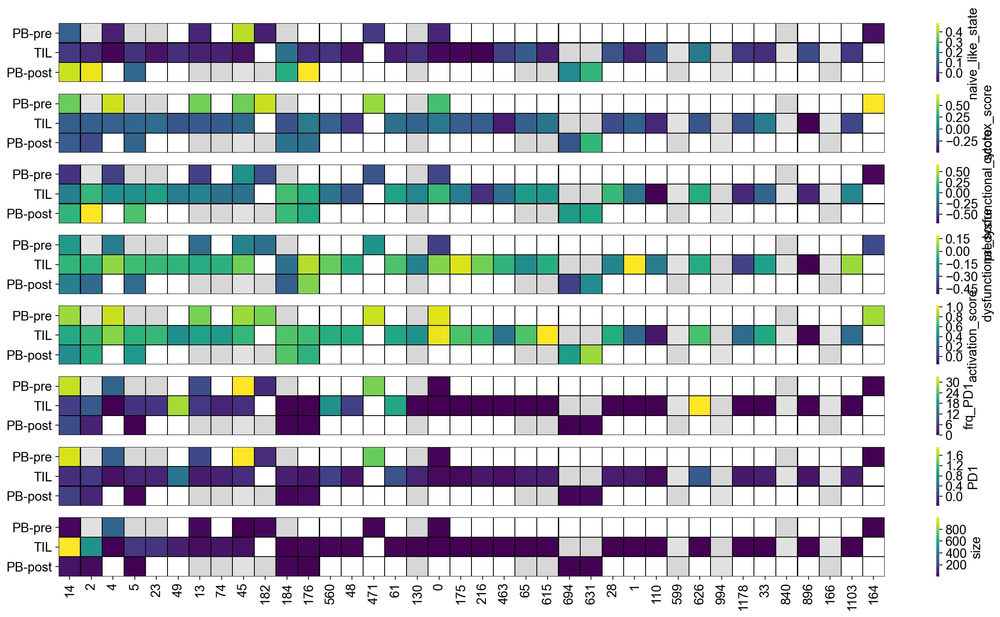

In [69]:
mask=adata.obs[adata.obs.clonotype_size>2].sort_values('clonotype_size', ascending=False).groupby('clonotype', sort=False).agg({'size_Infusion_product':'mean','size_Blood_before':'mean', 'size_Blood_after':'mean'}).T==0
mask=mask.loc[['size_Blood_before','size_Infusion_product','size_Blood_after'],mask.columns.isin(clonotypes_greater_2)].values
fig,ax=plt.subplots(nrows=8, figsize=(20,11))
for i, measure in enumerate(['naive_like_state','cytotox_score','predysfunctional_score', 'dysfunctional_score','activation_score','frq_PD1','PD1','size']):
    sizetable=adata.obs[adata.obs.clonotype_size>2].sort_values('clonotype_size', ascending=False).groupby('clonotype', sort=False).agg({'size_Infusion_product':'mean','size_Blood_before':'mean', 'size_Blood_after':'mean'}).T
    mask2=~((sizetable<3)&(sizetable!=0))
    mask2=mask2.loc[['size_Blood_before','size_Infusion_product','size_Blood_after'],mask2.columns.isin(clonotypes_greater_2)].values
    df=adata.obs[adata.obs.clonotype_size>2].sort_values('clonotype_size', ascending=False).groupby('clonotype', sort=False).agg({measure+'_Blood_before':'mean',measure+'_Infusion_product':'mean', measure+'_Blood_after':'mean'})
    df=df.T
    df=df.loc[:,df.columns.isin(clonotypes_greater_2)]
    max_value=df.values.flatten()[(sizetable.loc[['size_Blood_before','size_Infusion_product','size_Blood_after'],sizetable.columns.isin(clonotypes_greater_2)]>2).values.flatten()].max()
    min_value=df.values.flatten()[(sizetable.loc[['size_Blood_before','size_Infusion_product','size_Blood_after'],sizetable.columns.isin(clonotypes_greater_2)]>2).values.flatten()].min()
    sns.heatmap(df.values.tolist(), ax=ax[i], cmap='viridis', cbar_kws={'label': measure}, mask=mask, 
                linewidths=.5, linecolor='black', vmin=min_value, vmax=max_value)
    #mark sizes<3 in gray
    df2=adata.obs[adata.obs.clonotype_size>2].sort_values('clonotype_size', ascending=False).groupby('clonotype', sort=False).agg({'size_Blood_before':'mean','size_Infusion_product':'mean', 'size_Blood_after':'mean'})
    df2=df2.T
    df2=df2.loc[:,df2.columns.isin(clonotypes_greater_2)]
    sns.heatmap(df2.values.tolist(), ax=ax[i], cmap='gray', mask=mask2, 
                linewidths=.5, linecolor='black', vmin=-20, vmax=5, cbar=False)
    
    ax[i].set_yticklabels(['PB-pre', 'TIL', 'PB-post'], rotation=0)
    ax[i].set_xticklabels('')
    ax[i-1].set_xticks([])
ax[i].set_xticklabels([x for x in df.columns], rotation=90)
plt.show()

fig.savefig('./figures_paper/clonotypes_scores_supp.svg', bbox_inches='tight')
plt.show()

## Correlations with functional data

In [20]:
df_correlation=adata.obs[adata.obs.clonotype.isin(clonotypes_re_expression)]
df_correlation=df_correlation.groupby('clonotype').agg('mean')
df_correlation=df_correlation[df_correlation.index.isin(clonotypes_re_expression)]

FACS_values=pd.read_csv('FACS_mean_values_new.csv', sep=';', decimal=',', index_col=0)
interesting_clonotypes_colors=['red','blue','orange','black','greenyellow','lightblue', 'darkgreen', 'palevioletred', 'darkviolet','navy']

for valuename in FACS_values.columns.tolist():
    df_correlation[valuename]=FACS_values[valuename].tolist()
df_correlation['clonotype']=df_correlation.reset_index().clonotype.values.tolist()
df_correlation['clonotype']="TCR_"+df_correlation.clonotype
df_correlation.rename(columns={'cytotoxic_state':'cytotox_score',
                              'predysfunctional_state':'predysfunctional_score',
                              'dysfunctional_state':'dysfunctional_score'}, inplace=True)

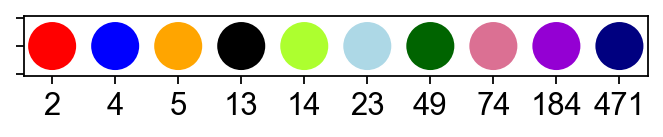

In [21]:
fig,ax=plt.subplots(figsize=(5,.5))
sns.scatterplot(x=df_correlation.index.tolist(), y=[0]*df_correlation.index.shape[0], hue=df_correlation.clonotype.tolist(),
                legend=None, palette=interesting_clonotypes_colors, s=500)
ax.grid(None)
ax.set_yticklabels('')
plt.show()

In [22]:
#remove values smaller than 3 from sizes
for size in ['size_Infusion_product', 'size_Blood_before','size_Blood_after']:
    df_correlation[size][df_correlation[size]<2]=0

In [23]:
samples=['Blood_before','Infusion_product','Blood_after']

In [24]:
def convert_significance(p):
    sig=', n.s.'
    if p < 0.05:
        sig='*'
    if p < 0.01:
        sig='**'
    if p < 0.001:
        sig='***'
    if p < 0.0001:
        sig='***'
    return sig

In [25]:
measures=['naive_like_state','cytotox_score','predysfunctional_score', 'dysfunctional_score', 'activation_score',
           'frq_PD1','PD1', 'size', 'TRA_expr', 'TRB_expr', 'TCR_expr']
correlations_PB=pd.DataFrame(index=measures, columns=['EC50_IFNg','EC50_IL2','EC50_TNFa'])
correlations_PB_p=correlations_PB.copy()
correlations_TIL=pd.DataFrame(index=measures, columns=['EC50_IFNg','EC50_IL2','EC50_TNFa'])
correlations_TIL_p=correlations_TIL.copy()

In [26]:
old_samplenames=['Infusion_product', 'Blood_before', 'Blood_after']
for samplename in old_samplenames:
    df_correlation['TRA_expr_'+samplename]=0
    df_correlation['TRB_expr_'+samplename]=0
    df_correlation['TCR_expr_'+samplename]=0

for i, clonotype in enumerate([x[4:] for x in df_correlation.clonotype.unique()]):
    for j, samplename in enumerate(adata.obs.samplename.unique().tolist()):
        df_temp1=pd.DataFrame(adata[np.logical_and(adata.obs.clonotype==clonotype,adata.obs.samplename==samplename)].obs.TRA_1_expr, columns=['TRA_1_expr'])
        if df_temp1.shape[0]!=0:
            df_correlation['TRA_expr_'+old_samplenames[j]][df_correlation.clonotype=='TCR_'+clonotype]=df_temp1.TRA_1_expr.mean()
        
        df_temp2=pd.DataFrame(adata[np.logical_and(adata.obs.clonotype==clonotype,adata.obs.samplename==samplename)].obs.TRB_1_expr, columns=['TRB_1_expr'])
        if df_temp2.shape[0]!=0:
            df_correlation['TRB_expr_'+old_samplenames[j]][df_correlation.clonotype=='TCR_'+clonotype]=df_temp2.TRB_1_expr.mean()

        df_temp=pd.DataFrame(df_temp1['TRA_1_expr']+df_temp2['TRB_1_expr'], columns=['TCR_expr'] )
        if df_temp.shape[0]!=0:
            df_correlation['TCR_expr_'+old_samplenames[j]][df_correlation.clonotype=='TCR_'+clonotype]=df_temp.TCR_expr.mean()
            
    print(str(np.round(((i+1)/len(df_correlation.clonotype.unique()))*100,1))+"%", end="\r", flush=True)

In [27]:
for i, cytokine in enumerate(['EC50_IFNg_pool', 'EC50_IL2_pool','EC50_TNFa_pool']):
    for j, measure in enumerate(measures):
        mask = ~np.isnan(df_correlation[cytokine]) & ~(df_correlation['size_Blood_before']==0)
        slope, intercept, r_value, p_value, std_err = stats.linregress(df_correlation[cytokine][mask], df_correlation[measure+'_Blood_before'][mask])
        correlations_PB.loc[measure,cytokine[:-5]]=r_value**2
        correlations_PB_p.loc[measure,cytokine[:-5]]=convert_significance(p_value)
        
        mask = ~np.isnan(df_correlation[cytokine]) & ~(df_correlation['size_Infusion_product']==0)
        slope, intercept, r_value, p_value, std_err = stats.linregress(df_correlation[cytokine][mask], df_correlation[measure+'_Infusion_product'][mask])
        correlations_TIL.loc[measure,cytokine[:-5]]=r_value**2
        correlations_TIL_p.loc[measure,cytokine[:-5]]=convert_significance(p_value)

In [28]:
correlations_TIL_p[correlations_TIL_p==', n.s.']=''
correlations_PB_p[correlations_PB_p==', n.s.']=''

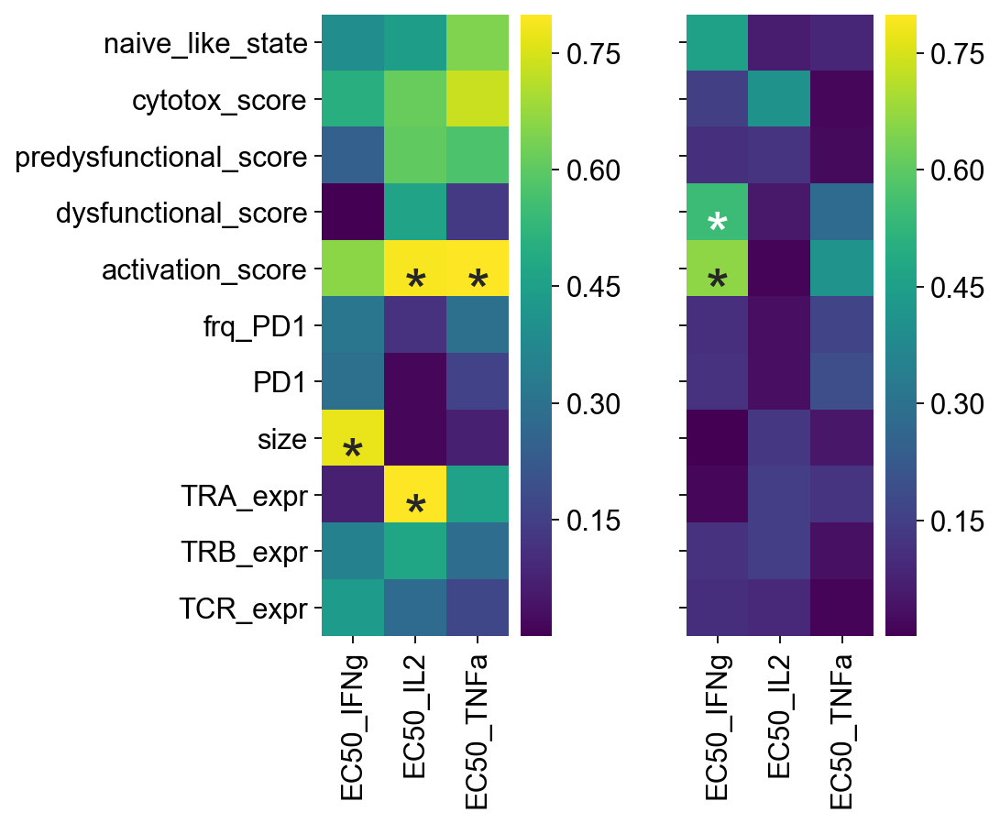

In [29]:
fig,ax=plt.subplots(ncols=2, figsize=(5,5))
fig.tight_layout(w_pad=2)
sns.heatmap(correlations_PB.astype(float), cmap='viridis', ax=ax[0], vmax=.8, annot=correlations_PB_p, fmt = '',annot_kws={'size':30, 'va':'top'})
sns.heatmap(correlations_TIL.astype(float), cmap='viridis', ax=ax[1], vmax=.8, annot=correlations_TIL_p, fmt = '',annot_kws={'size':30, 'va':'top'})
ax[1].set_yticklabels([''])
fig.savefig('./figures_paper/heatmap _correlation.svg', bbox_inches='tight')

In [30]:
value_pairs_PB=[['EC50_IFNg','activation_score_Blood_before'],
                ['EC50_IL2','activation_score_Blood_before'],
                ['EC50_TNFa','activation_score_Blood_before']]

value_pairs_TIL=[['EC50_IFNg','activation_score_Infusion_product'],
                ['EC50_IFNg','dysfunctional_score_Infusion_product']]

In [31]:
df_correlation['colors']=interesting_clonotypes_colors

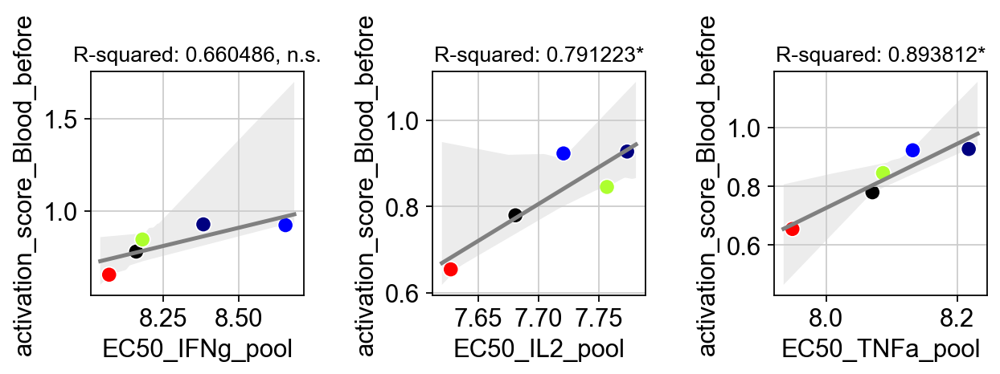

In [32]:
fig,ax=plt.subplots(ncols=3, figsize=(8,2.5))
fig.tight_layout(w_pad=2)
colors=interesting_clonotypes_colors
samplename='PB-pre'
for i, pair in enumerate(value_pairs_PB):
    mask = ~np.isnan(df_correlation[pair[0]+'_pool']) & ~(df_correlation['size_Blood_before']==0)
    sns.regplot(df_correlation[mask][pair[0]+'_pool'], df_correlation[mask][pair[1]], ax=ax[i], color='gray', ci=95)
    sns.scatterplot(df_correlation[mask][pair[0]+'_pool'], df_correlation[mask][pair[1]], hue=df_correlation[mask].clonotype, palette=df_correlation[mask].colors, legend=None, ax=ax[i], s=75)
    slope, intercept, r_value, p_value, std_err = stats.linregress(df_correlation[pair[0]+'_pool'][mask], df_correlation[pair[1]][mask])
    ax[i].set_title(label=("R-squared: %f" % r_value**2)+convert_significance(p_value), size=12)
fig.savefig('./figures_paper/correlation_examples.svg', bbox_inches='tight')

In [33]:
value_pairs_PB=[['EC50_IFNg','activation_score_Blood_before'],
                ['EC50_IFNg','dysfunctional_score_Blood_before'],
               ['EC50_IFNg','cytotox_score_Blood_before']]

value_pairs_TIL=[['EC50_IFNg','activation_score_Infusion_product'],
                ['EC50_IFNg','dysfunctional_score_Infusion_product'],
                ['EC50_IFNg','cytotox_score_Infusion_product']]

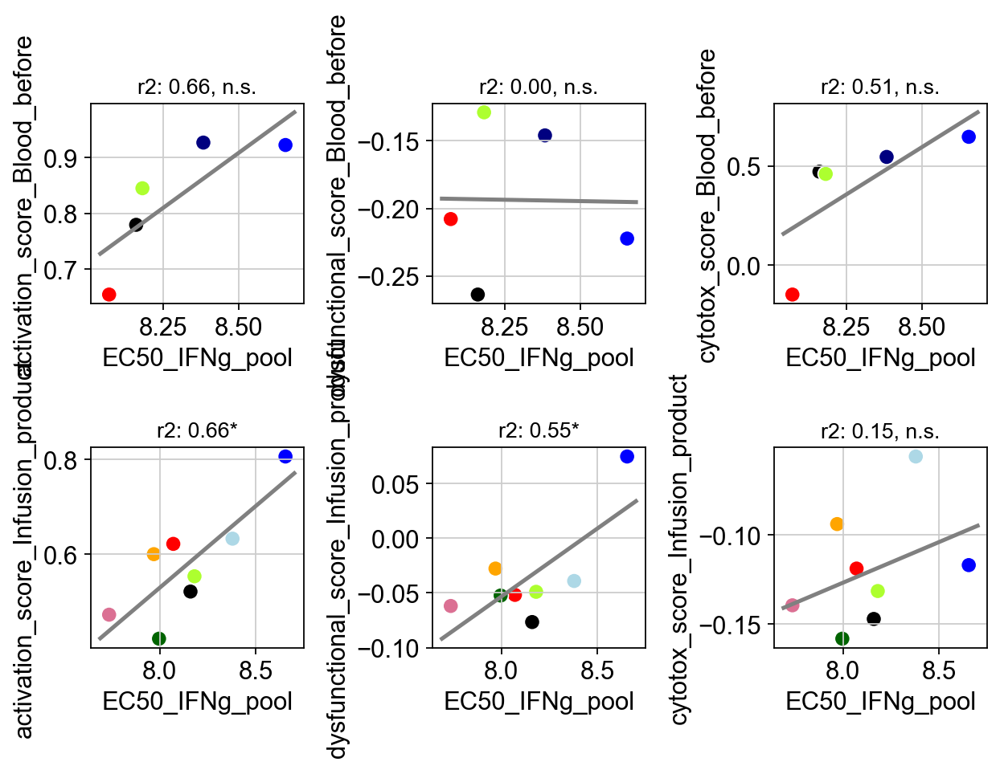

In [34]:
fig,ax=plt.subplots(nrows=2, ncols=3, figsize=(8,5))
fig.tight_layout(w_pad=2, h_pad=4)
colors=interesting_clonotypes_colors
samplename='PB-pre'
for i, pair in enumerate(value_pairs_PB):
    mask = ~np.isnan(df_correlation[pair[0]+'_pool']) & (df_correlation['size_Blood_before']>=2)
    sns.regplot(df_correlation[mask][pair[0]+'_pool'], df_correlation[mask][pair[1]], ax=ax[0,i], color='gray', ci=0, line_kws={'linestyle':'-'})
    sns.scatterplot(df_correlation[mask][pair[0]+'_pool'], df_correlation[mask][pair[1]], hue=df_correlation[mask].clonotype, palette=df_correlation[mask].colors, legend=None, ax=ax[0,i], s=75)
    slope, intercept, r_value, p_value, std_err = stats.linregress(df_correlation[pair[0]+'_pool'][mask], df_correlation[pair[1]][mask])
    ax[0,i].set_title(label=("r2: %.2f" % r_value**2)+convert_significance(p_value), size=12)
for i, pair in enumerate(value_pairs_TIL):
    mask = ~np.isnan(df_correlation[pair[0]+'_pool']) & (df_correlation['size_Infusion_product']>=2)
    sns.regplot(df_correlation[mask][pair[0]+'_pool'], df_correlation[mask][pair[1]], ax=ax[1,i], color='gray', ci=0, line_kws={'linestyle':'-'})
    sns.scatterplot(df_correlation[mask][pair[0]+'_pool'], df_correlation[mask][pair[1]], hue=df_correlation[mask].clonotype, palette=df_correlation[mask].colors, legend=None, ax=ax[1,i], s=75)
    slope, intercept, r_value, p_value, std_err = stats.linregress(df_correlation[pair[0]+'_pool'][mask], df_correlation[pair[1]][mask])
    ax[1,i].set_title(label=("r2: %.2f" % r_value**2)+convert_significance(p_value), size=12)
fig.savefig('./figures_paper/correlation_examples.svg', bbox_inches='tight')

In [35]:
data=adata.obs.groupby('clonotype').agg({'size_Blood_before':'mean',
                                  'size_Infusion_product':'mean',
                                  'size_Blood_after':'mean'})

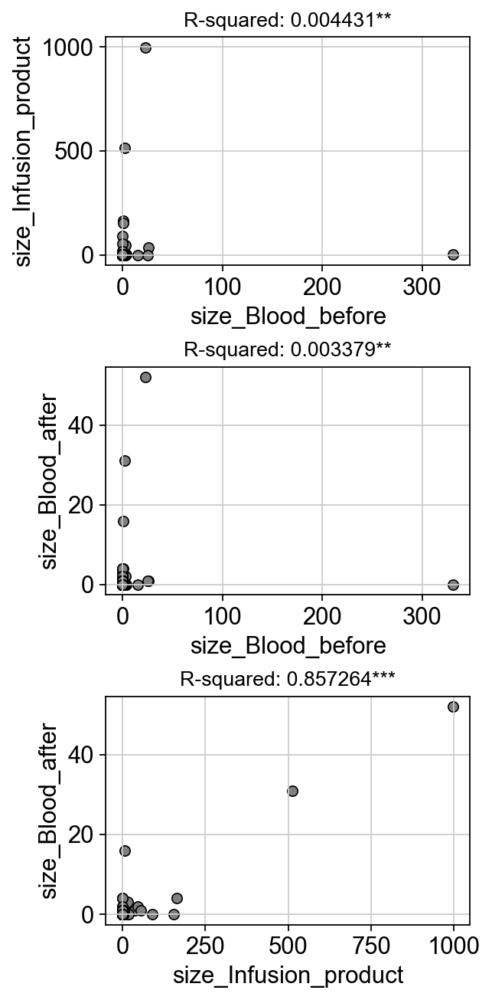

In [36]:
fig, ax =plt.subplots(nrows=3, figsize=(4,8))
fig.tight_layout(h_pad=2.5)
sns.scatterplot(data=data, x='size_Blood_before', y='size_Infusion_product', edgecolor='black', color='gray', ax=ax[0])
slope, intercept, r_value, p_value, std_err = stats.linregress(data['size_Blood_before'], data['size_Infusion_product'])
ax[0].set_title(label=("R-squared: %f" % r_value**2)+convert_significance(p_value), size=12)

sns.scatterplot(data=data, x='size_Blood_before', y='size_Blood_after', edgecolor='black', color='gray', ax=ax[1])
slope, intercept, r_value, p_value, std_err = stats.linregress(data['size_Blood_before'], data['size_Blood_after'])
ax[1].set_title(label=("R-squared: %f" % r_value**2)+convert_significance(p_value), size=12)

sns.scatterplot(data=data, x='size_Infusion_product', y='size_Blood_after', edgecolor='black', color='gray', ax=ax[2])
slope, intercept, r_value, p_value, std_err = stats.linregress(data['size_Infusion_product'], data['size_Blood_after'])
ax[2].set_title(label=("R-squared: %f" % r_value**2)+convert_significance(p_value), size=12)

fig.savefig('./figures_paper/size_correlations.svg', bbox_inches='tight')

In [37]:
ICCS_data=pd.read_csv('values_ICCS_pooled_TP.csv', sep=';', decimal=',')

In [38]:
ICCS_data['experiment']='none'
ICCS_data['experiment'][ICCS_data.Replicate.isin(['Rep1','Rep2','Rep3'])]='Exp 1'
ICCS_data['experiment'][ICCS_data.Replicate.isin(['Rep4','Rep5','Rep6'])]='Exp 2'

In [39]:
ICCS_data.TCR=ICCS_data.TCR.str.replace(' ','_')

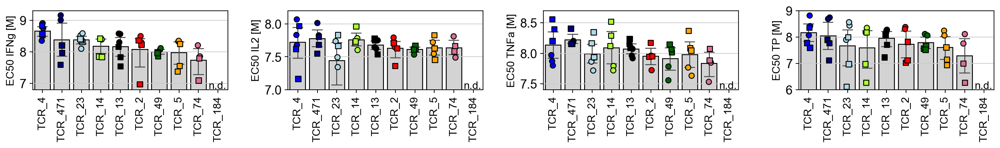

In [40]:
fig,axes=plt.subplots(ncols=4, figsize=(16,2))
fig.tight_layout(w_pad=2)
for i, cytokine in enumerate(['IFNg','IL2','TNFa','TP']):
    ax=axes[i]
    sns.barplot(data=ICCS_data[ICCS_data.Cytokine==cytokine], x='TCR',y='EC50',ax=ax, palette=['lightgray'],
                order=df_correlation.sort_values('EC50_IFNg_pool', ascending=False)['clonotype'].tolist(),edgecolor='black',
                linewidth=1,errwidth=1, capsize=.5)
    sns.stripplot(data=ICCS_data[(ICCS_data.Cytokine==cytokine)&(ICCS_data.experiment=='Exp 1')], x='TCR',y='EC50',ax=ax, 
                  edgecolor='black', linewidth=1, marker='o', 
                  palette=df_correlation.sort_values('EC50_IFNg_pool', ascending=False)['colors'], s=6,
                 order=df_correlation.sort_values('EC50_IFNg_pool', ascending=False)['clonotype'].tolist())
    sns.stripplot(data=ICCS_data[(ICCS_data.Cytokine==cytokine)&(ICCS_data.experiment=='Exp 2')], x='TCR',y='EC50',ax=ax, 
                  edgecolor='black', linewidth=1, marker='s', 
                  palette=df_correlation.sort_values('EC50_IFNg_pool', ascending=False)['colors'], s=6,
                  order=df_correlation.sort_values('EC50_IFNg_pool', ascending=False)['clonotype'].tolist())
    ax.set_xticklabels(ax.get_xticklabels(), size=12, rotation=90)
    ax.set_xlabel('')
    ax.text(0.9,0.015,'n.d.', transform=ax.transAxes, size=12)
axes[0].set_ylim(6.8,9.3)
axes[0].set_ylabel('EC50 IFNg [M]', size=12)
axes[1].set_ylim(7,8.2)
axes[1].set_ylabel('EC50 IL2 [M]', size=12)
axes[2].set_ylim(7.4,8.7)
axes[2].set_ylabel('EC50 TNFa [M]', size=12)
axes[3].set_ylim(6,9)
axes[3].set_ylabel('EC50 TP [M]', size=12)
plt.savefig('./figures_paper/EC50_IFNg.svg', bbox_inches='tight')
plt.show()

## Genes correlating with TCR functionality

In [41]:
ICCS_data['clonotype']=[x[4:] for x in ICCS_data.TCR]
adata_selected=adata[np.logical_and(adata.obs.clonotype.isin(['2','4','13','14','471']),adata.obs.samplename=='PB-pre')]
adata_selected.obs['functionality']=0
adata_selected.obs['functionality'][adata_selected.obs.clonotype.isin(['4','23','471'])]='high'
adata_selected.obs['functionality'][adata_selected.obs.clonotype.isin(['74'])]='low'
adata_selected.obs['functionality'][adata_selected.obs.clonotype.isin(['5','2','49','13','14'])]='intermediate'
adata_selected.obs['functionality'][adata_selected.obs.clonotype.isin(['184'])]='non-functional'
adata_selected.obs['EC50_IFNG_mean']=0
for clonotype in adata_selected.obs.clonotype.unique():
    adata_selected.obs['EC50_IFNG_mean'][adata_selected.obs.clonotype==clonotype]=df_correlation.loc[clonotype,'EC50_IFNg_pool']
sc.pp.highly_variable_genes(adata_selected)

Trying to set attribute `.obs` of view, copying.


In [42]:
generate_corr_data=True
if generate_corr_data==True:
    correlation_data=pd.DataFrame(index=adata_selected.var_names.tolist(), columns=['slope','intercept','r_value','p_value','std_err'])
    for i, gene in enumerate(adata_selected.var_names.tolist()):
        adata_selected.obs[gene]=[x[0] for x in adata_selected[:,adata_selected.var_names==gene].X]
        data=adata_selected.obs.groupby('clonotype').agg({gene:'mean','EC50_IFNG_mean':'mean'})
        correlation_data.loc[gene] = stats.linregress(data['EC50_IFNG_mean'], data[gene])
        print(str(np.round(((i+1)/len(adata_selected.var_names.tolist()))*100,1))+' %',end="\r", flush=True)
    correlation_data['r_squared']=correlation_data['r_value']**2
    correlation_data.sort_values('slope', ascending=False).to_excel('correlating_genes_IFNG.xls')
    correlation_data[(correlation_data.p_value<0.05)].sort_values('slope', ascending=False).to_excel('correlating_genes_IFNG_siginificant.xls')
if generate_corr_data==False:
    correlation_data=pd.read_excel('correlating_genes_IFNG.xls', index_col=0)

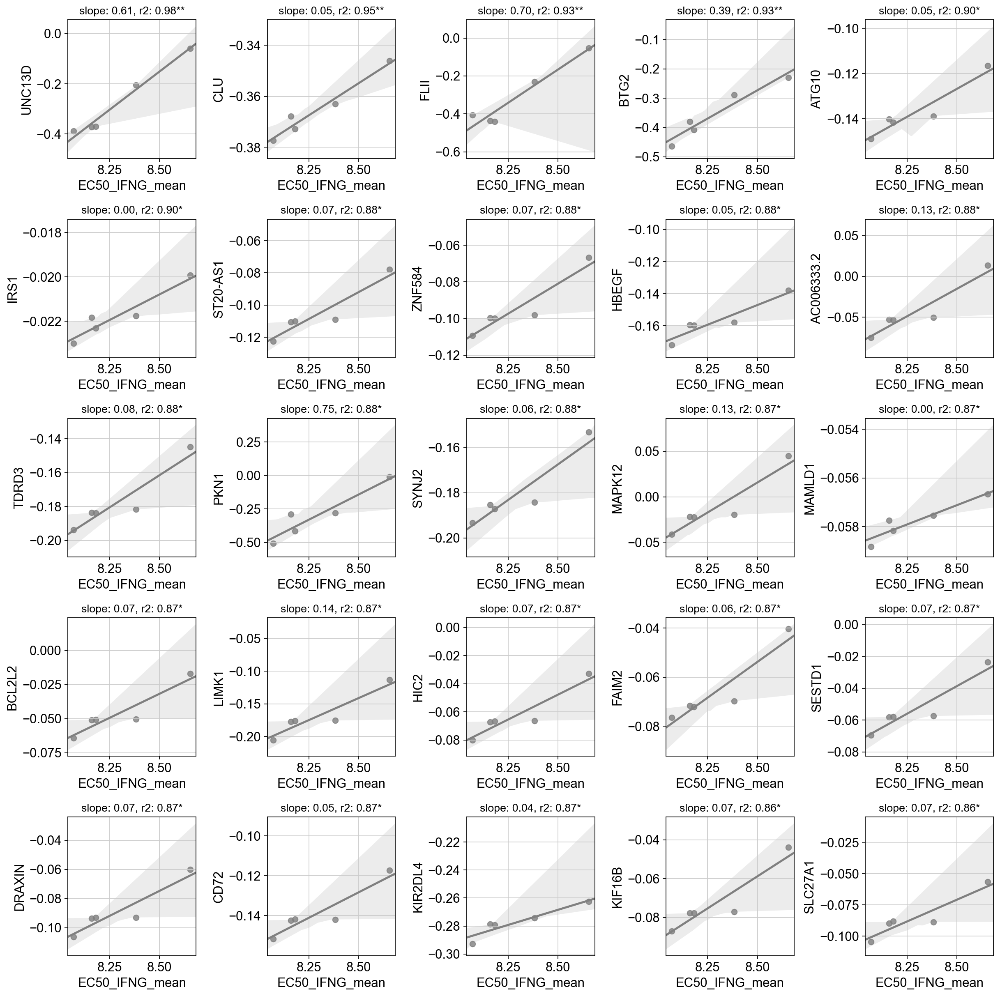

In [43]:
fig, ax=plt.subplots(ncols=5, nrows=5, figsize=(15,15))
fig.tight_layout(w_pad=3, h_pad=3)
for i, gene in enumerate(correlation_data.sort_values('r_value', ascending=False).index.tolist()[:25]):
    data=adata_selected.obs.groupby('clonotype').agg({gene:'mean','EC50_IFNG_mean':'mean'})
    sns.regplot(data=data, x='EC50_IFNG_mean',y=gene, color='gray', marker='o', ax=ax.reshape(-1)[i])
    ax.reshape(-1)[i].set_title('slope: %.2f' % correlation_data.loc[gene,'slope']+', r2: %.2f' % correlation_data.loc[gene,'r_squared']+convert_significance(correlation_data.loc[gene,'p_value']), size=12)

In [44]:
cytotox_genes=['KLRG1','PRF1','FCGR3A','CX3CR1']
dysfunctional_genes=['LAG3', 'PDCD1', 'LAYN', 'HAVCR2','CTLA4']
activation_genes=['TNFRSF9','IFNG','TNF','GZMB','PRF1','NKG7','XCL1','XCL2','CCL3','CCL4','CCL5','CST7','STAT1','TGFB1']

In [45]:
plot_data=correlation_data.sort_values('r_value', ascending=False)
plot_data=plot_data[plot_data.p_value<0.05]
plot_data['gene']=plot_data.index.tolist()
plot_data['color']='gray'
plot_data['color'][plot_data.gene.isin(cytotox_genes)]='red'
plot_data['color'][plot_data.gene.isin(dysfunctional_genes)]='black'
plot_data['color'][plot_data.gene.isin(['TCF7','CCR7','SELL','LEF1','IL7R',
'KLRG1','PRF1','FCGR3A','CX3CR1',
'EOMES', 'GZMK', 'CXCR3',
'LAG3', 'PDCD1', 'LAYN', 'HAVCR2','CTLA4',
'TNFRSF9','IFNG','TNF','GZMB','PRF1','NKG7','XCL1','XCL2','CCL3','CCL4','CCL5','CST7','STAT1','TGFB1'])]='orange'

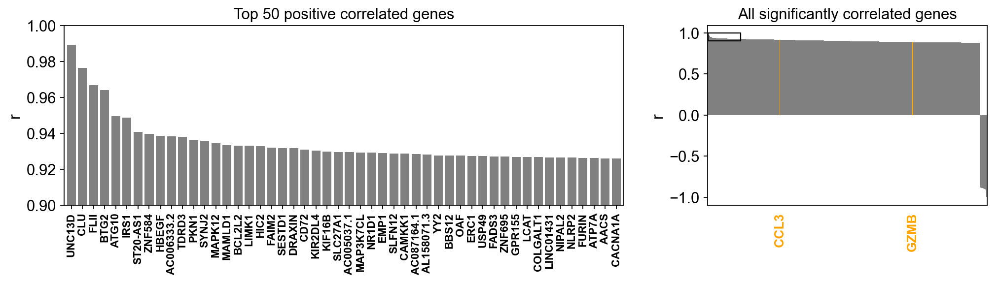

In [46]:
from matplotlib.patches import Rectangle
fig, ax = plt.subplots(1, 2, gridspec_kw={'width_ratios': [2, 1]}, figsize=(15,3))
s=pd.Series(plot_data['r_value'], index=plot_data['gene'])
s.plot(kind='bar', ax=ax[1], color=plot_data.color.tolist(), width=1, grid=False)
s[:50].plot(kind='bar', ax=ax[0], color=plot_data.color.tolist(), width=.8, grid=False)

ax[1].set_xticklabels([plot_data.iloc[i].gene if plot_data.iloc[i].color != 'gray' else ' ' for i in range(plot_data.shape[0])], fontdict={'fontsize': '12',
        'fontweight': 'bold'})
ax[0].set_xticklabels(ax[0].get_xticklabels(), fontdict={'fontsize': '10','fontweight': 'semibold'})

ax[1].add_patch(Rectangle(xy=(0, 0.9), width=50, height=0.1, fill=False, edgecolor='black'))

ax[0].set_title('Top 50 positive correlated genes')
ax[1].set_title('All significantly correlated genes')
ax[0].set_ylabel('r')
ax[1].set_ylabel('r')
ax[0].set_ylim([0.9,1])
ax[1].xaxis.set_ticks_position('none')

for ticklabel, tickcolor in zip(ax[1].get_xticklabels(), plot_data.color.tolist()):
    ticklabel.set_color(tickcolor)

for ax in ax:
    ax.set_xlabel('')
fig.savefig('./figures_paper/waterfall_new.pdf', bbox_inches='tight')
plt.show()

In [47]:
correlation_data['correlation']='not significant'
correlation_data['correlation'][(correlation_data.p_value<0.05)&(correlation_data.r_value>0)]='significantly pos'
correlation_data['correlation'][(correlation_data.p_value<0.05)&(correlation_data.r_value<0)]='significantly neg'

In [48]:
annotation=['GZMB', 'CCL3', 'BTG1', 'UNC13D', 'CLU', 'BTG2', 'ATG10', 'IRS1', 'ST20-AS1','PKN1']
correlation_data['annotation']=False
correlation_data['annotation'][correlation_data.index.isin(annotation)]=True

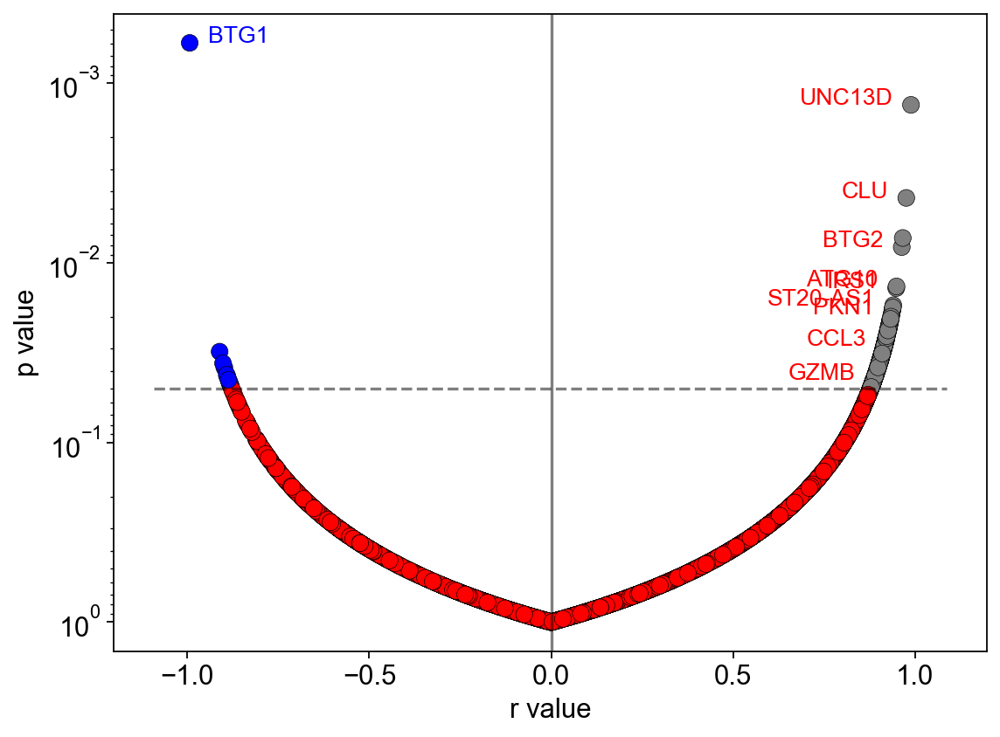

In [49]:
fig,ax=plt.subplots(figsize=(8,6))
sns.scatterplot(data=correlation_data, x='r_value', y='p_value', hue='correlation', palette=['red', 'gray', 'blue'],ax=ax,
               edgecolor='black', linewidth=.3, s=75)
ax.set_yscale('log')
ax.set_ylim(ax.get_ylim()[::-1])
for line in range(0,correlation_data.shape[0]):
    if (correlation_data.iloc[line].correlation=='significantly pos')&(correlation_data.index[line] in annotation):
        ax.text(correlation_data.r_value[line]-0.05, correlation_data.p_value[line], correlation_data.index[line],
                horizontalalignment='right', size=12, color='red')
    if (correlation_data.iloc[line].correlation=='significantly neg')&(correlation_data.index[line] in annotation):
        ax.text(correlation_data.r_value[line]+0.05, correlation_data.p_value[line], correlation_data.index[line],
                horizontalalignment='left', size=12, color='blue')
    if (correlation_data.iloc[line].correlation=='not significant')&(correlation_data.index[line] in annotation):
        ax.text(correlation_data.r_value[line]+0.05, correlation_data.p_value[line], correlation_data.index[line],
                horizontalalignment='left', size=12, color='black')
ax.vlines(x=0, ymin=ax.get_ylim()[0], ymax=ax.get_ylim()[1], alpha=.5)
ax.hlines(y=0.05, xmin=ax.get_xlim()[0], xmax=ax.get_xlim()[1], linestyles='--', alpha=.5)
ax.grid(False)
ax.get_legend().remove()
ax.set_xlabel('r value')
ax.set_ylabel('p value')
fig.savefig('./figures_paper/volcano.svg', bbox_inches='tight')

In [50]:
correlation_data['p_value'][correlation_data.p_value>0.1]=0.1

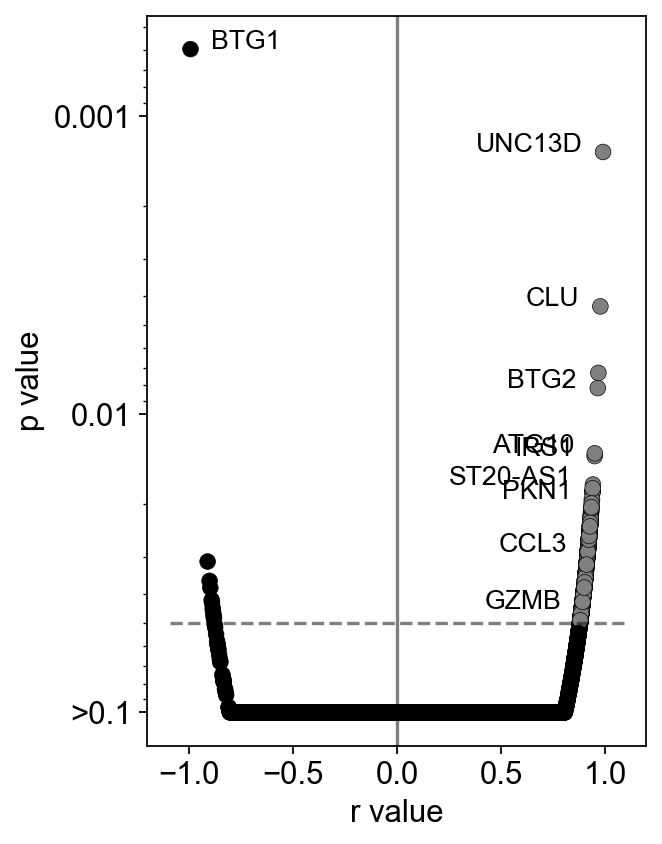

In [51]:
fig,ax=plt.subplots(figsize=(4,6))
sns.scatterplot(data=correlation_data, x='r_value', y='p_value', hue='correlation', palette=['black', 'gray', 'black'],ax=ax,
               edgecolor='black', linewidth=.3, s=50)
ax.set_yscale('log')
ax.set_ylim(ax.get_ylim()[::-1])
for line in range(0,correlation_data.shape[0]):
    if (correlation_data.iloc[line].correlation=='significantly pos')&(correlation_data.index[line] in annotation):
        ax.text(correlation_data.r_value[line]-0.1, correlation_data.p_value[line], correlation_data.index[line],
                horizontalalignment='right', size=12, color='black')
    if (correlation_data.iloc[line].correlation=='significantly neg')&(correlation_data.index[line] in annotation):
        ax.text(correlation_data.r_value[line]+0.1, correlation_data.p_value[line], correlation_data.index[line],
                horizontalalignment='left', size=12, color='black')
    if (correlation_data.iloc[line].correlation=='not significant')&(correlation_data.index[line] in annotation):
        ax.text(correlation_data.r_value[line]+0.1, correlation_data.p_value[line], correlation_data.index[line],
                horizontalalignment='left', size=12, color='black')
ax.vlines(x=0, ymin=ax.get_ylim()[0], ymax=ax.get_ylim()[1], alpha=.5)
ax.hlines(y=0.05, xmin=ax.get_xlim()[0], xmax=ax.get_xlim()[1], linestyles='--', alpha=.5)
ax.grid(False)
ax.get_legend().remove()
ax.set_xlabel('r value')
ax.set_ylabel('p value')
labels = ax.get_yticks().tolist()
labels[4] = ">0.1"
ax.set_yticklabels(labels)
fig.savefig('./figures_paper/volcano_neu.svg', bbox_inches='tight')

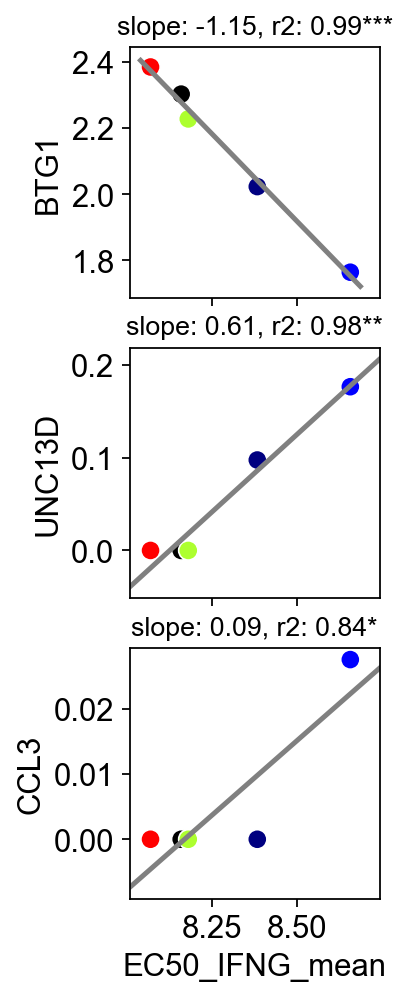

In [52]:
import anndata
adata_selected_raw=anndata.AnnData(adata_selected.raw.X.todense(), var=adata_selected.raw.var, obs=adata_selected.obs)
fig, ax=plt.subplots(nrows=3, figsize=(2,7), sharex=True)
for i, gene in enumerate(['BTG1', 'UNC13D', 'CCL3']):
    adata_selected_raw.obs[gene]=adata_selected.obs[gene]=[x[0,0] for x in adata_selected.raw[:,adata_selected.raw.var_names==gene].X]
    data=adata_selected_raw.obs.groupby('clonotype').agg({gene:'mean','EC50_IFNG_mean':'mean','clonotype':'first'})
    data['colors']=df_correlation[df_correlation.index.isin(data.index)].colors
    sns.regplot(data=data, x='EC50_IFNG_mean',y=gene, color='gray', marker='o', ax=ax.reshape(-1)[i], ci=0)
    sns.scatterplot(data=data, x='EC50_IFNG_mean',y=gene, hue='clonotype', hue_order=data.clonotype.tolist(), palette=data['colors'].tolist(), marker='o', ax=ax.reshape(-1)[i], legend=None, s=75)
    ax.reshape(-1)[i].set_title('slope: %.2f' % correlation_data.loc[gene,'slope']+', r2: %.2f' % correlation_data.loc[gene,'r_squared']+convert_significance(correlation_data.loc[gene,'p_value']), size=12)
    ax.reshape(-1)[i].grid(False)
    ax.reshape(-1)[i].set_xlim([8.01,8.74])
fig.savefig('./figures_paper/single_correlations.svg', bbox_inches='tight')    

In [53]:
sequences=pd.read_json('./VDJ/outs/all_contig_annotations.json')

In [54]:
clones=adata.obs.clonotype[adata.obs.clonotype_size>2].value_counts().sort_values(ascending=False).index.tolist()
df_temp=adata[(adata.obs.clonotype.isin(clones))&(adata.obs.has_tcr=='True')].obs.groupby('clonotype').agg({'clonotype_size':'mean',
                                                                                  'samplename':lambda x:x.value_counts().index[0],
                                                                                  'leiden':lambda x:x.value_counts().index[0],
                                                                                  'TRA_1_v_gene':lambda x:x.value_counts().index[0],
                                                                                 'TRA_1_j_gene':lambda x:x.value_counts().index[0],
                                                                                 'TRA_1_cdr3':lambda x:x.value_counts().index[0],
                                                                                 'TRA_1_cdr3_nt':lambda x:x.value_counts().index[0],
                                                                                 'TRB_1_v_gene':lambda x:x.value_counts().index[0],
                                                                                 'TRB_1_j_gene':lambda x:x.value_counts().index[0],
                                                                                 'TRB_1_cdr3':lambda x:x.value_counts().index[0],
                                                                                 'TRB_1_cdr3_nt':lambda x:x.value_counts().index[0],
                                                                                 'TRA_2_v_gene':lambda x:x.value_counts().index[0],
                                                                                 'TRA_2_j_gene':lambda x:x.value_counts().index[0],
                                                                                 'TRA_2_cdr3':lambda x:x.value_counts().index[0],
                                                                                 'TRA_2_cdr3_nt':lambda x:x.value_counts().index[0],
                                                                                 'TRB_2_v_gene':lambda x:x.value_counts().index[0],
                                                                                 'TRB_2_j_gene':lambda x:x.value_counts().index[0],
                                                                                 'TRB_2_cdr3':lambda x:x.value_counts().index[0],
                                                                                 'TRB_2_cdr3_nt':lambda x:x.value_counts().index[0],
                                                                                 'chain_pairing':lambda x:x.value_counts().index[0],
                                                                                 'size_Infusion_product':'mean', 'frq_PD1_Infusion_product':'mean',
                                                                                 'PD1_Infusion_product':'mean', 'activation_score_Infusion_product':'mean',
                                                                                 'predysfunctional_score_Infusion_product':'mean',
                                                                                 'dysfunctional_score_Infusion_product':'mean',
                                                                                 'cytotox_score_Infusion_product':'mean',
                                                                                 'naive_like_state_Infusion_product':'mean',
                                                                                 'size_Blood_before':'mean',
                                                                                 'frq_PD1_Blood_before':'mean', 'PD1_Blood_before':'mean',
                                                                                 'activation_score_Blood_before':'mean', 'predysfunctional_score_Blood_before':'mean',
                                                                                 'dysfunctional_score_Blood_before':'mean', 'cytotox_score_Blood_before':'mean',
                                                                                 'naive_like_state_Blood_before':'mean',
                                                                                 'size_Blood_after':'mean',
                                                                                 'frq_PD1_Blood_after':'mean', 'PD1_Blood_after':'mean',
                                                                                 'activation_score_Blood_after':'mean', 'predysfunctional_score_Blood_after':'mean',
                                                                                 'dysfunctional_score_Blood_after':'mean', 'cytotox_score_Blood_after':'mean',
                                                                                 'naive_like_state_Blood_after':'mean'})
df_temp['alpha_1_contig']='none'
df_temp['beta_1_contig']='none'
df_temp['alpha_2_contig']='none'
df_temp['beta_2_contig']='none'
for i in range(df_temp.shape[0]):
    if df_temp.iloc[i].TRA_1_cdr3 != 'None':
        df_temp.alpha_1_contig[i]=sequences[sequences.cdr3==df_temp.iloc[i].TRA_1_cdr3].sequence.value_counts().index[0]
    if df_temp.iloc[i].TRB_1_cdr3 != 'None':
        df_temp.beta_1_contig[i]=sequences[sequences.cdr3==df_temp.iloc[i].TRB_1_cdr3].sequence.value_counts().index[0]
    if df_temp.iloc[i].TRA_2_cdr3 != 'None':
        df_temp.alpha_2_contig[i]=sequences[sequences.cdr3==df_temp.iloc[i].TRA_2_cdr3].sequence.value_counts().index[0]
    if df_temp.iloc[i].TRB_2_cdr3 != 'None':
        df_temp.beta_2_contig[i]=sequences[sequences.cdr3==df_temp.iloc[i].TRB_2_cdr3].sequence.value_counts().index[0]
df_temp[['clonotype_size', 'samplename', 'leiden', 'TRA_1_v_gene',
   'TRA_1_j_gene', 'TRA_1_cdr3', 'TRA_1_cdr3_nt', 'TRB_1_v_gene',
   'TRB_1_j_gene', 'TRB_1_cdr3', 'TRB_1_cdr3_nt', 'TRA_2_v_gene',
   'TRA_2_j_gene', 'TRA_2_cdr3', 'TRA_2_cdr3_nt', 'TRB_2_v_gene',
   'TRB_2_j_gene', 'TRB_2_cdr3', 'TRB_2_cdr3_nt',
   'alpha_1_contig', 'beta_1_contig', 'alpha_2_contig', 'beta_2_contig', 'chain_pairing','size_Infusion_product', 'frq_PD1_Infusion_product',
                                                                                 'PD1_Infusion_product', 'activation_score_Infusion_product',
                                                                                 'predysfunctional_score_Infusion_product',
                                                                                 'dysfunctional_score_Infusion_product',
                                                                                 'cytotox_score_Infusion_product',
                                                                                 'naive_like_state_Infusion_product',
                                                                                 'size_Blood_before',
                                                                                 'frq_PD1_Blood_before', 'PD1_Blood_before',
                                                                                 'activation_score_Blood_before', 'predysfunctional_score_Blood_before',
                                                                                 'dysfunctional_score_Blood_before', 'cytotox_score_Blood_before',
                                                                                 'naive_like_state_Blood_before',
                                                                                 'size_Blood_after',
                                                                                 'frq_PD1_Blood_after', 'PD1_Blood_after',
                                                                                 'activation_score_Blood_after', 'predysfunctional_score_Blood_after',
                                                                                 'dysfunctional_score_Blood_after', 'cytotox_score_Blood_after',
                                                                                 'naive_like_state_Blood_after']].sort_values('clonotype_size', ascending=False).to_excel('./TCR_sequences_condensed.xls')

In [55]:
correlation_data[['slope','intercept','r_value','p_value','std_err', 'r_squared','correlation']].sort_values('r_value', ascending=False).to_excel('./Correlating_genes.xls')